In [35]:
import importlib
import nik_io, nik_train, nik_recon
importlib.reload(nik_io)
importlib.reload(nik_train)
importlib.reload(nik_recon)

import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['savefig.dpi'] = 300

from nik_io import load_cartesian_kspace
from nik_recon import ifft1d_kz_to_z_cartesian

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


In [36]:
# load cart, pick one slice
CART_FILE = '/scratch/rnga/vvpshenov/XCAT-ERIC/results/simulation_results_20260326T113845_cart.mat'
cart = load_cartesian_kspace(CART_FILE, load_images=True)
k_cart = torch.from_numpy(cart['k_cart'].astype(np.complex64)).to(device)
k_z = ifft1d_kz_to_z_cartesian(k_cart)

t, c, z = 0, 0, k_z.shape[2] // 2
k2d = k_z[t, c, z, :, :]
nky, nkx = k2d.shape
img = torch.fft.ifft2(k2d).abs().cpu().numpy().T
print(k2d.shape, img.shape)

torch.Size([214, 312]) (312, 214)


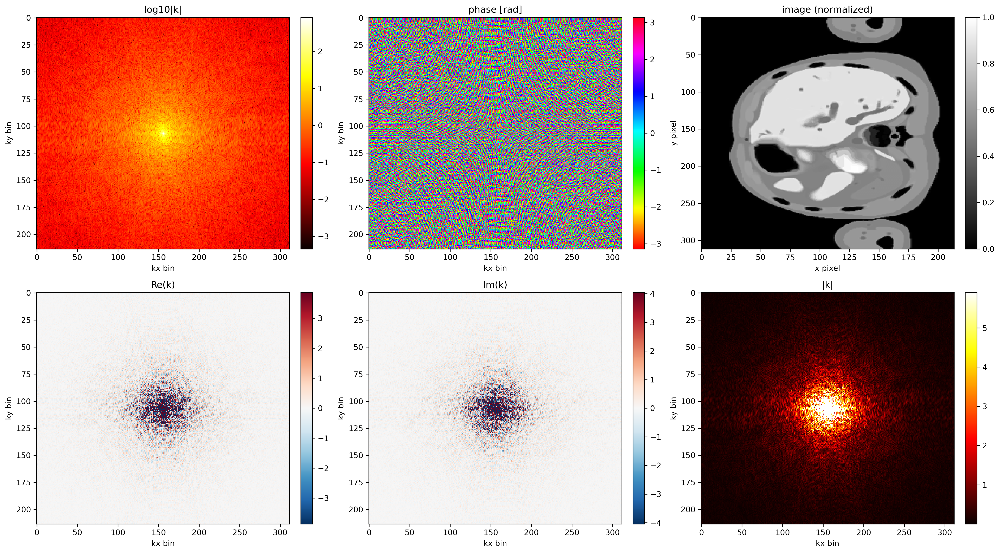

In [37]:
# look at k-space and the image
k_np = k2d.cpu().numpy()

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

def add_im(ax, data, title, cmap, vmin=None, vmax=None, xlabel='kx bin', ylabel='ky bin'):
    im = ax.imshow(data, cmap=cmap, aspect='auto', vmin=vmin, vmax=vmax)
    ax.set_title(title)
    ax.set_xlabel(xlabel); ax.set_ylabel(ylabel)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

add_im(axes[0, 0], np.log10(np.abs(k_np) + 1e-10), 'log10|k|', 'hot')
add_im(axes[0, 1], np.angle(k_np), 'phase [rad]', 'hsv', vmin=-np.pi, vmax=np.pi)
add_im(axes[0, 2], img / img.max(), 'image (normalized)', 'gray', xlabel='x pixel', ylabel='y pixel')

v = np.percentile(np.abs(k_np.real), 99)
add_im(axes[1, 0], k_np.real, 'Re(k)', 'RdBu_r', vmin=-v, vmax=v)
v = np.percentile(np.abs(k_np.imag), 99)
add_im(axes[1, 1], k_np.imag, 'Im(k)', 'RdBu_r', vmin=-v, vmax=v)
add_im(axes[1, 2], np.abs(k_np), '|k|', 'hot', vmax=np.percentile(np.abs(k_np), 99))

plt.tight_layout(); plt.show()

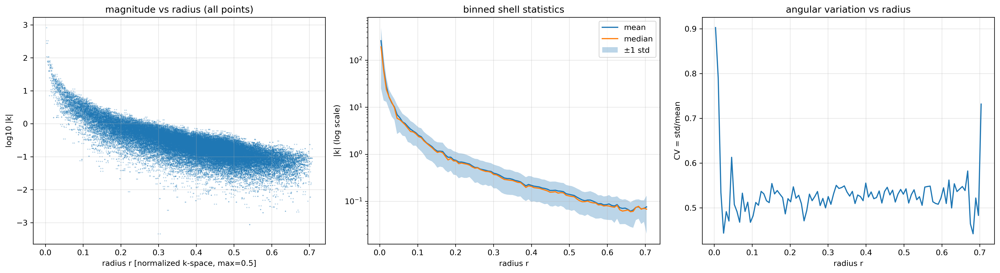

In [38]:
# magnitude vs radius — scatter, binned mean/median, angular CV
kx_lin = torch.linspace(-0.5, 0.5, nkx)
ky_lin = torch.linspace(-0.5, 0.5, nky)
KY, KX = torch.meshgrid(ky_lin, kx_lin, indexing='ij')
R = torch.sqrt(KX**2 + KY**2).numpy()
mag = np.abs(k_np)

r_flat = R.flatten()
m_flat = mag.flatten()
r_max = r_flat.max()
n_bins = 100
bin_centers = np.linspace(0, r_max, n_bins + 1)
bin_centers = (bin_centers[:-1] + bin_centers[1:]) / 2
bin_idx = np.clip((r_flat / r_max * n_bins).astype(int), 0, n_bins - 1)

bin_mean = np.zeros(n_bins); bin_std = np.zeros(n_bins); bin_med = np.zeros(n_bins)
for b in range(n_bins):
    m = bin_idx == b
    if m.sum() > 0:
        bin_mean[b] = m_flat[m].mean()
        bin_std[b] = m_flat[m].std()
        bin_med[b] = np.median(m_flat[m])

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].scatter(r_flat, np.log10(m_flat + 1e-10), s=0.3, alpha=0.3)
axes[0].set_xlabel('radius r [normalized k-space, max=0.5]')
axes[0].set_ylabel('log10 |k|')
axes[0].set_title('magnitude vs radius (all points)')
axes[0].grid(True, alpha=0.3)

axes[1].semilogy(bin_centers, bin_mean, label='mean')
axes[1].semilogy(bin_centers, bin_med, label='median')
axes[1].fill_between(bin_centers, np.maximum(bin_mean - bin_std, 1e-10), bin_mean + bin_std, alpha=0.3, label='±1 std')
axes[1].set_xlabel('radius r')
axes[1].set_ylabel('|k| (log scale)')
axes[1].set_title('binned shell statistics')
axes[1].legend(); axes[1].grid(True, alpha=0.3)

axes[2].plot(bin_centers, bin_std / (bin_mean + 1e-10))
axes[2].set_xlabel('radius r')
axes[2].set_ylabel('CV = std/mean')
axes[2].set_title('angular variation vs radius')
axes[2].grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

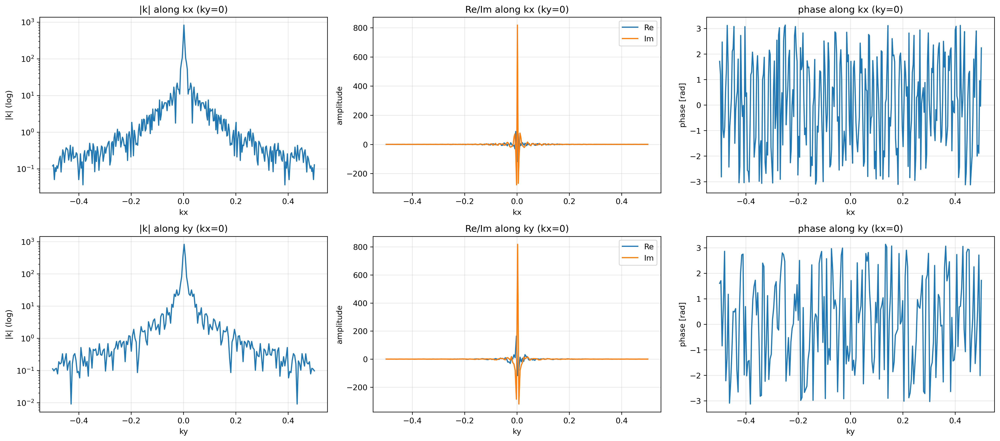

In [39]:
# slices through center along kx and ky
kx_p = k_np[nky // 2, :]
ky_p = k_np[:, nkx // 2]
kx_c = np.linspace(-0.5, 0.5, nkx)
ky_c = np.linspace(-0.5, 0.5, nky)

fig, axes = plt.subplots(2, 3, figsize=(18, 8))
for i, (p, c, lbl) in enumerate([(kx_p, kx_c, 'kx (ky=0)'), (ky_p, ky_c, 'ky (kx=0)')]):
    axes[i, 0].plot(c, np.abs(p))
    axes[i, 0].set_yscale('log'); axes[i, 0].set_title(f'|k| along {lbl}')
    axes[i, 0].set_xlabel(lbl.split()[0]); axes[i, 0].set_ylabel('|k| (log)')
    axes[i, 0].grid(True, alpha=0.3)

    axes[i, 1].plot(c, p.real, label='Re'); axes[i, 1].plot(c, p.imag, label='Im')
    axes[i, 1].set_title(f'Re/Im along {lbl}')
    axes[i, 1].set_xlabel(lbl.split()[0]); axes[i, 1].set_ylabel('amplitude')
    axes[i, 1].legend(); axes[i, 1].grid(True, alpha=0.3)

    axes[i, 2].plot(c, np.angle(p))
    axes[i, 2].set_title(f'phase along {lbl}')
    axes[i, 2].set_xlabel(lbl.split()[0]); axes[i, 2].set_ylabel('phase [rad]')
    axes[i, 2].grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

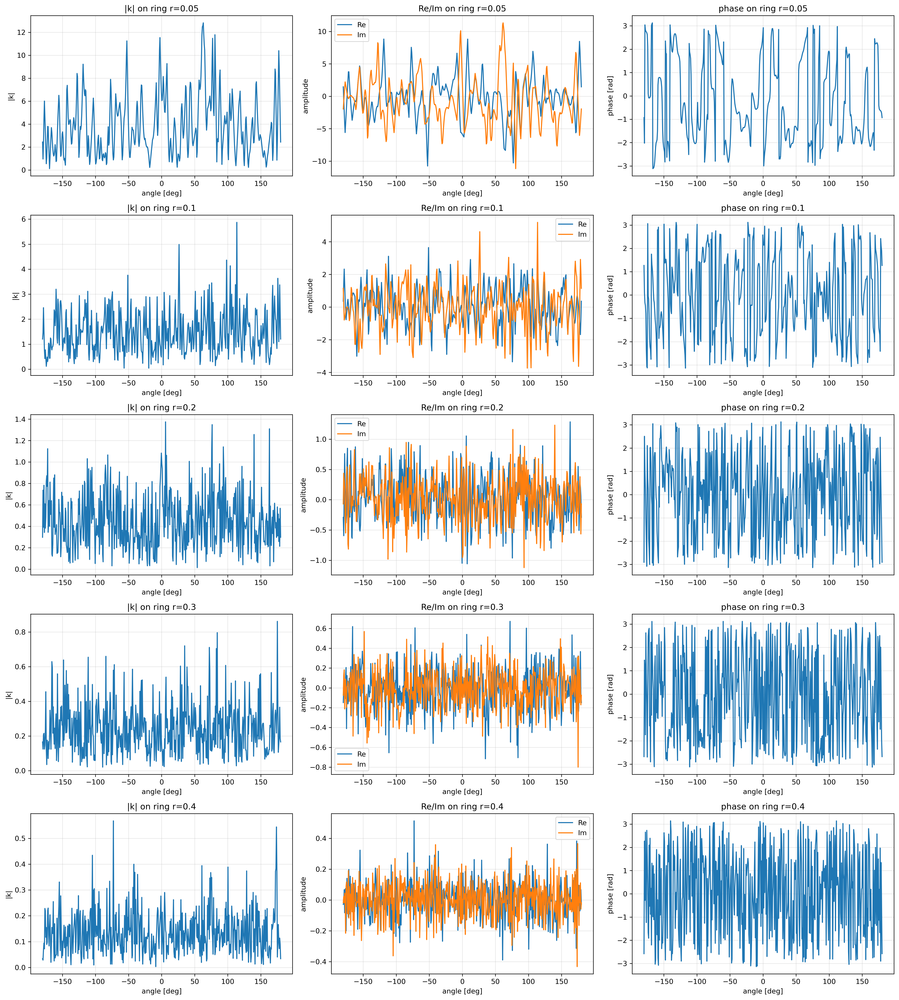

In [40]:
# rings at different radii
radii = [0.05, 0.1, 0.2, 0.3, 0.4]
n_theta = 512
theta = np.linspace(-np.pi, np.pi, n_theta)

fig, axes = plt.subplots(len(radii), 3, figsize=(18, 4*len(radii)))
for i, r0 in enumerate(radii):
    ix = (r0 * np.cos(theta) + 0.5) * (nkx - 1)
    iy = (r0 * np.sin(theta) + 0.5) * (nky - 1)
    ix0 = np.clip(np.floor(ix).astype(int), 0, nkx - 2)
    iy0 = np.clip(np.floor(iy).astype(int), 0, nky - 2)
    fx = ix - ix0; fy = iy - iy0
    v = (k_np[iy0, ix0]*(1-fx)*(1-fy) + k_np[iy0, ix0+1]*fx*(1-fy) +
         k_np[iy0+1, ix0]*(1-fx)*fy + k_np[iy0+1, ix0+1]*fx*fy)

    th_deg = np.degrees(theta)
    axes[i, 0].plot(th_deg, np.abs(v))
    axes[i, 0].set_title(f'|k| on ring r={r0}')
    axes[i, 0].set_xlabel('angle [deg]'); axes[i, 0].set_ylabel('|k|')
    axes[i, 0].grid(True, alpha=0.3)

    axes[i, 1].plot(th_deg, v.real, label='Re')
    axes[i, 1].plot(th_deg, v.imag, label='Im')
    axes[i, 1].set_title(f'Re/Im on ring r={r0}')
    axes[i, 1].set_xlabel('angle [deg]'); axes[i, 1].set_ylabel('amplitude')
    axes[i, 1].legend(); axes[i, 1].grid(True, alpha=0.3)

    axes[i, 2].plot(th_deg, np.angle(v))
    axes[i, 2].set_title(f'phase on ring r={r0}')
    axes[i, 2].set_xlabel('angle [deg]'); axes[i, 2].set_ylabel('phase [rad]')
    axes[i, 2].grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

exp [644.02902151 219.97006609] rmse=3.2185
pow [1.04922132e+07 4.30663643e+05 1.43664090e+00] rmse=2.8394
gauss [  409.91223693 22503.92591171] rmse=3.4035


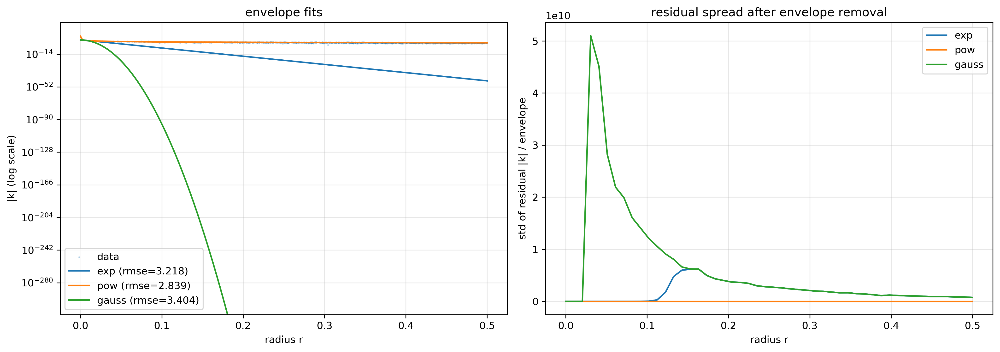

In [41]:
# fit envelope to radial decay
from scipy.optimize import curve_fit

mask = r_flat < 0.5
rf = r_flat[mask]; mf = m_flat[mask]

def expf(r, a, b): return a * np.exp(-b * r)
def powf(r, a, b, c): return a / (1 + b * r)**c
def gaussf(r, a, b): return a * np.exp(-b * r**2)

fits = {}
for name, fn, p0 in [('exp', expf, [mag.max(), 5.0]),
                     ('pow', powf, [mag.max(), 10.0, 2.0]),
                     ('gauss', gaussf, [mag.max(), 10.0])]:
    try:
        popt, _ = curve_fit(fn, rf, mf, p0=p0, maxfev=10000)
        rmse = np.sqrt(((mf - fn(rf, *popt))**2).mean())
        fits[name] = {'popt': popt, 'fn': fn, 'rmse': rmse}
        print(f'{name} {popt} rmse={rmse:.4f}')
    except Exception as e:
        print(f'{name} failed: {e}')

r_p = np.linspace(0, 0.5, 200)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].scatter(rf[::50], mf[::50], s=1, alpha=0.2, label='data')
for name, info in fits.items():
    axes[0].plot(r_p, info['fn'](r_p, *info['popt']), label=f"{name} (rmse={info['rmse']:.3f})")
axes[0].set_yscale('log')
axes[0].set_xlabel('radius r')
axes[0].set_ylabel('|k| (log scale)')
axes[0].set_title('envelope fits')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

for name, info in fits.items():
    res = mf / (info['fn'](rf, *info['popt']) + 1e-10)
    n_b = 50
    bi = np.clip((rf / 0.5 * n_b).astype(int), 0, n_b - 1)
    bs = np.array([res[bi == b].std() if (bi == b).sum() > 0 else 0 for b in range(n_b)])
    axes[1].plot(np.linspace(0, 0.5, n_b), bs, label=name)
axes[1].set_xlabel('radius r')
axes[1].set_ylabel('std of residual |k| / envelope')
axes[1].set_title('residual spread after envelope removal')
axes[1].legend(); axes[1].grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

pow


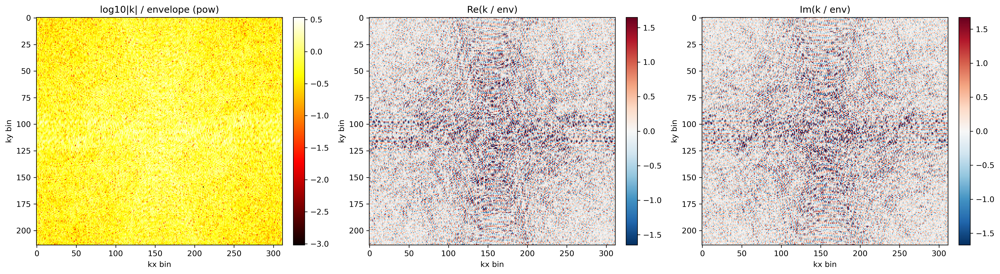

In [42]:
# divide by best envelope, see what's left
best = min(fits, key=lambda n: fits[n]['rmse'])
print(best)
info = fits[best]
env = info['fn'](R, *info['popt'])
k_n = k_np / (env + 1e-10)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
im0 = axes[0].imshow(np.log10(np.abs(k_n) + 1e-10), cmap='hot', aspect='auto')
axes[0].set_title(f'log10|k| / envelope ({best})')
axes[0].set_xlabel('kx bin'); axes[0].set_ylabel('ky bin')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

v = np.percentile(np.abs(k_n.real), 99)
im1 = axes[1].imshow(k_n.real, cmap='RdBu_r', aspect='auto', vmin=-v, vmax=v)
axes[1].set_title('Re(k / env)')
axes[1].set_xlabel('kx bin'); axes[1].set_ylabel('ky bin')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

v = np.percentile(np.abs(k_n.imag), 99)
im2 = axes[2].imshow(k_n.imag, cmap='RdBu_r', aspect='auto', vmin=-v, vmax=v)
axes[2].set_title('Im(k / env)')
axes[2].set_xlabel('kx bin'); axes[2].set_ylabel('ky bin')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout(); plt.show()

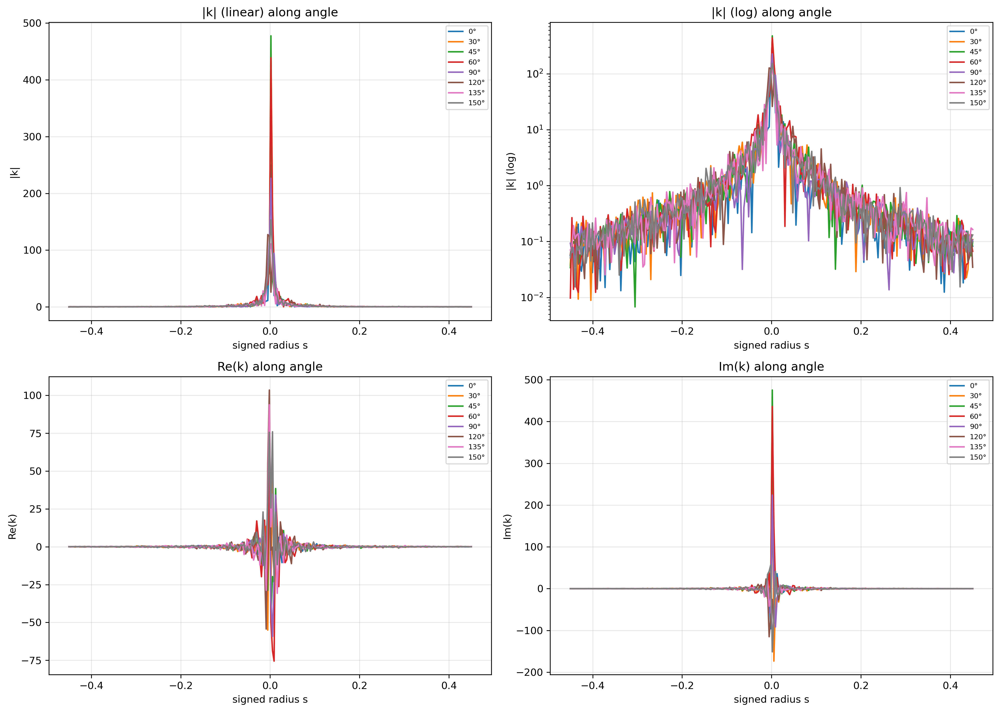

In [43]:
# lines through center at different angles
angles = [0, 30, 45, 60, 90, 120, 135, 150]
n_s = 256
s = np.linspace(-0.45, 0.45, n_s)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for a in angles:
    rad = np.radians(a)
    ix = (s * np.cos(rad) + 0.5) * (nkx - 1)
    iy = (s * np.sin(rad) + 0.5) * (nky - 1)
    ix0 = np.clip(np.floor(ix).astype(int), 0, nkx - 2)
    iy0 = np.clip(np.floor(iy).astype(int), 0, nky - 2)
    fx = ix - ix0; fy = iy - iy0
    v = (k_np[iy0, ix0]*(1-fx)*(1-fy) + k_np[iy0, ix0+1]*fx*(1-fy) +
         k_np[iy0+1, ix0]*(1-fx)*fy + k_np[iy0+1, ix0+1]*fx*fy)
    axes[0, 0].plot(s, np.abs(v), label=f'{a}°')
    axes[0, 1].semilogy(s, np.abs(v), label=f'{a}°')
    axes[1, 0].plot(s, v.real, label=f'{a}°')
    axes[1, 1].plot(s, v.imag, label=f'{a}°')

for ax in axes.flat:
    ax.set_xlabel('signed radius s')
    ax.grid(True, alpha=0.3)
axes[0, 0].set_title('|k| (linear) along angle')
axes[0, 0].set_ylabel('|k|'); axes[0, 0].legend(fontsize=7)
axes[0, 1].set_title('|k| (log) along angle')
axes[0, 1].set_ylabel('|k| (log)'); axes[0, 1].legend(fontsize=7)
axes[1, 0].set_title('Re(k) along angle')
axes[1, 0].set_ylabel('Re(k)'); axes[1, 0].legend(fontsize=7)
axes[1, 1].set_title('Im(k) along angle')
axes[1, 1].set_ylabel('Im(k)'); axes[1, 1].legend(fontsize=7)
plt.tight_layout(); plt.show()

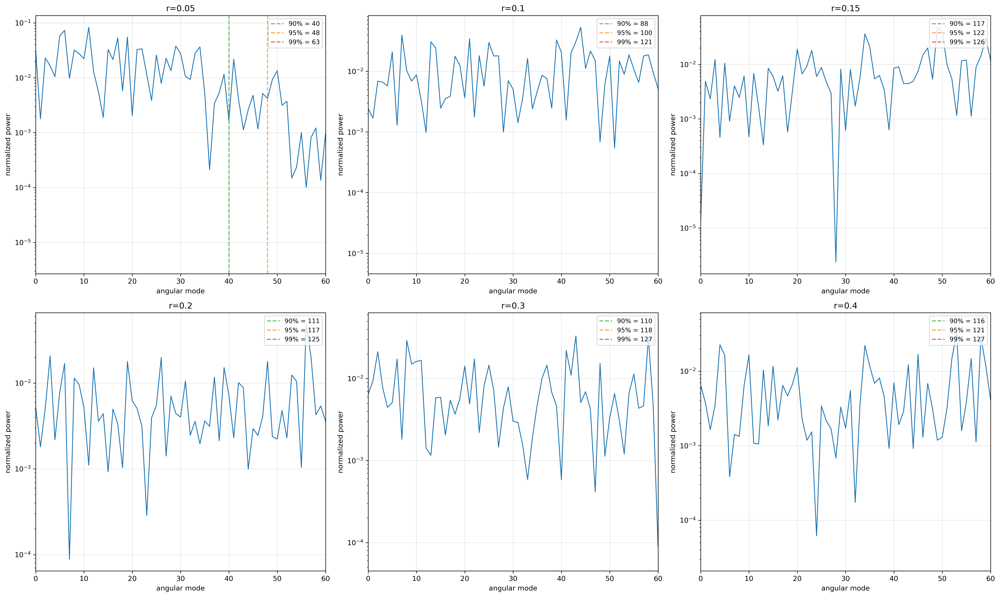

In [44]:
# how many angular modes do we need at each radius
radii = [0.05, 0.1, 0.15, 0.2, 0.3, 0.4]
n_theta = 256
theta = np.linspace(-np.pi, np.pi, n_theta, endpoint=False)

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
for i, r0 in enumerate(radii):
    ix = (r0 * np.cos(theta) + 0.5) * (nkx - 1)
    iy = (r0 * np.sin(theta) + 0.5) * (nky - 1)
    ix0 = np.clip(np.floor(ix).astype(int), 0, nkx - 2)
    iy0 = np.clip(np.floor(iy).astype(int), 0, nky - 2)
    fx = ix - ix0; fy = iy - iy0
    v = (k_np[iy0, ix0]*(1-fx)*(1-fy) + k_np[iy0, ix0+1]*fx*(1-fy) +
         k_np[iy0+1, ix0]*(1-fx)*fy + k_np[iy0+1, ix0+1]*fx*fy)

    p = np.abs(np.fft.fft(v))**2
    p = p[:n_theta // 2]
    pn = p / p.sum()
    cp = np.cumsum(pn)

    ax = axes[i // 3, i % 3]
    ax.semilogy(np.arange(len(pn)), pn, lw=1.2)
    ax.set_title(f'r={r0}')
    ax.set_xlabel('angular mode')
    ax.set_ylabel('normalized power')
    ax.set_xlim(0, 60)
    ax.grid(True, alpha=0.3)

    colors = ['tab:green', 'tab:orange', 'tab:red']
    for pct, col in zip([0.9, 0.95, 0.99], colors):
        n = np.searchsorted(cp, pct) + 1
        ax.axvline(n, linestyle='--', alpha=0.7, color=col, label=f'{int(pct*100)}% = {n}')
    ax.legend(loc='upper right', fontsize=9)

plt.tight_layout(); plt.show()

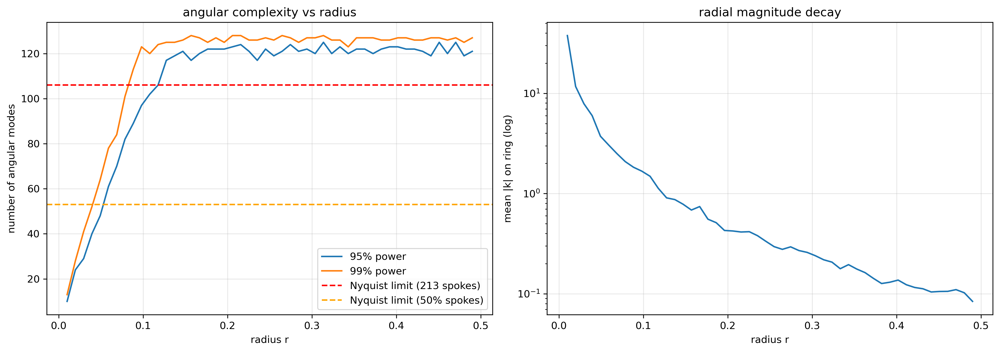

r=0.1: 97 modes 95%
r=0.3: 120 modes 95%
r=0.49: 121 modes 95%


In [45]:
# scan radius -> num angular modes needed
rs = np.linspace(0.01, 0.49, 50)
n_theta = 256
theta = np.linspace(-np.pi, np.pi, n_theta, endpoint=False)

m95 = []; m99 = []; mag_avg = []
for r0 in rs:
    ix = (r0 * np.cos(theta) + 0.5) * (nkx - 1)
    iy = (r0 * np.sin(theta) + 0.5) * (nky - 1)
    ix0 = np.clip(np.floor(ix).astype(int), 0, nkx - 2)
    iy0 = np.clip(np.floor(iy).astype(int), 0, nky - 2)
    fx = ix - ix0; fy = iy - iy0
    v = (k_np[iy0, ix0]*(1-fx)*(1-fy) + k_np[iy0, ix0+1]*fx*(1-fy) +
         k_np[iy0+1, ix0]*(1-fx)*fy + k_np[iy0+1, ix0+1]*fx*fy)

    p = np.abs(np.fft.fft(v)[:n_theta // 2])**2
    pn = p / (p.sum() + 1e-20)
    cp = np.cumsum(pn)
    m95.append(np.searchsorted(cp, 0.95) + 1)
    m99.append(np.searchsorted(cp, 0.99) + 1)
    mag_avg.append(np.abs(v).mean())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(rs, m95, label='95% power')
axes[0].plot(rs, m99, label='99% power')
axes[0].axhline(213 // 2, color='r', ls='--', label='Nyquist limit (213 spokes)')
axes[0].axhline(213 * 0.5 // 2, color='orange', ls='--', label='Nyquist limit (50% spokes)')
axes[0].set_xlabel('radius r')
axes[0].set_ylabel('number of angular modes')
axes[0].set_title('angular complexity vs radius')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].semilogy(rs, mag_avg)
axes[1].set_xlabel('radius r')
axes[1].set_ylabel('mean |k| on ring (log)')
axes[1].set_title('radial magnitude decay')
axes[1].grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

print(f'r=0.1: {m95[np.argmin(np.abs(rs-0.1))]} modes 95%')
print(f'r=0.3: {m95[np.argmin(np.abs(rs-0.3))]} modes 95%')
print(f'r=0.49: {m95[-1]} modes 95%')

pkLUT entries: 73
labels shape: (11, 214, 312), unique: [ 0  9 10 13 14 15 16 17 18 20] ...
ke: min=0.0000 max=1.6600
ve: min=0.0000 max=0.9000
vp: min=0.0000 max=0.6000
label_slice shape: (214, 312)


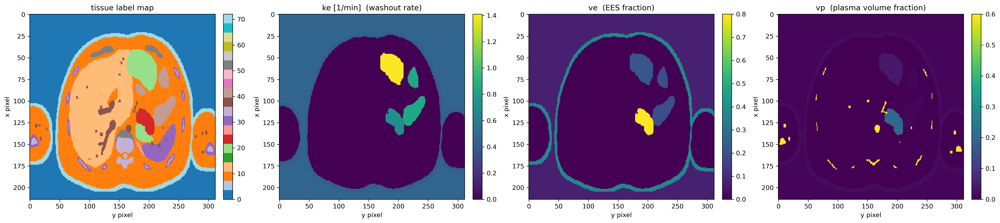

In [46]:
# DCE qMRI parameter maps (from pkLUT + labelGT)
import h5py

with h5py.File(CART_FILE, 'r') as f:
    dt = f['/results/pkLUT/dt'][()].flatten()     # time constants
    ke = f['/results/pkLUT/ke'][()].flatten()     # washout rate
    ve = f['/results/pkLUT/ve'][()].flatten()     # extravascular-extracellular fraction
    vp = f['/results/pkLUT/vp'][()].flatten()     # plasma volume fraction
    labels = f['/results/labelGT'][()]            # (kz, x, y) tissue label per pixel

print(f'pkLUT entries: {len(dt)}')
print(f'labels shape: {labels.shape}, unique: {np.unique(labels)[:10]} ...')
print(f'ke: min={ke.min():.4f} max={ke.max():.4f}')
print(f've: min={ve.min():.4f} max={ve.max():.4f}')
print(f'vp: min={vp.min():.4f} max={vp.max():.4f}')

# labels[i,j,k] is an index into the pkLUT arrays — build parameter maps
label_slice = labels[labels.shape[0] // 2]  # middle z-slice, shape (x, y)
print(f'label_slice shape: {label_slice.shape}')

ke_map = ke[label_slice]
ve_map = ve[label_slice]
vp_map = vp[label_slice]

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
im = axes[0].imshow(label_slice, cmap='tab20', aspect='auto')
axes[0].set_title('tissue label map')
axes[0].set_xlabel('y pixel'); axes[0].set_ylabel('x pixel')
fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

im = axes[1].imshow(ke_map, cmap='viridis', aspect='auto')
axes[1].set_title('ke [1/min]  (washout rate)')
axes[1].set_xlabel('y pixel'); axes[1].set_ylabel('x pixel')
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

im = axes[2].imshow(ve_map, cmap='viridis', aspect='auto')
axes[2].set_title('ve  (EES fraction)')
axes[2].set_xlabel('y pixel'); axes[2].set_ylabel('x pixel')
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

im = axes[3].imshow(vp_map, cmap='viridis', aspect='auto')
axes[3].set_title('vp  (plasma volume fraction)')
axes[3].set_xlabel('y pixel'); axes[3].set_ylabel('x pixel')
fig.colorbar(im, ax=axes[3], fraction=0.046, pad=0.04)

plt.tight_layout(); plt.show()